## EAQI Classification 2021 - Notebook

In [1]:
###############################################
###                Imports                  ###
###############################################
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.tree import export_graphviz
from IPython.display import Image
import warnings
from sklearn.metrics import confusion_matrix
from imblearn.combine import SMOTEENN 
warnings.filterwarnings('ignore')


df = pd.read_csv('../processed_data/full_data_imputed_with_EAQI.csv')
df = df.dropna()

In [2]:
#################################################
###            General Information            ###
#################################################

print('\033[1m' + '\033[91m'+ 'General Information' + '\033[91m'+'\033[0m')
print("\nThe goal of this Classification is to classify the EAQI with the dates, Weather data and Traffic data without using the data from the atmospheric gases.\nThe following models are structured as follow:\n1.Cross validated\n2. RFE (random feature elimination)\n3. Oversampling (if needed)\n\nDue to the distribution of the data only non-linear classification models will be used.")

General Information

The goal of this Classification is to classify the EAQI with the dates, Weather data and Traffic data without using the data from the atmospheric gases.
The following models are structured as follow:
1.Cross validated
2. RFE (random feature elimination)
3. Oversampling (if needed)

Due to the distribution of the data only non-linear classification models will be used.


In [29]:
#################################################
### General Settings: (Activate / Deactivate) ###
###          To test certain chunks           ###
#################################################

###################################
# 1. K-Nearest-Neighbor (Knn)
# 1.1 without oversampling
knn = True
#1.2 without oversampling
knn_oversampling = True

###################################
# 2. Decision Tree
# 2.1 without oversampling
decision_tree = True
#2.2 with oversampling
decision_tree_oversampling=True

###################################
# 3. Random Forest
# 3.1 with oversampling
random_forest = True
#3.2 without oversampling
random_forest_oversampling = True

In [4]:
###############################################
### split dataset into a train and test set ###
###############################################

#use the data to 2021 for training a new model.
print('Instances of AQI')
print(df['AQI'].value_counts())
print('\nIt is seen that there is only 1 instance of AQI of 4. The SMOTEENN Algorithm (see below) can not oversample this class because the class "AQI = 4" has to have more instances. So we will get rid of this instance')
df = df.loc[df['AQI']<4]

df_train = df.loc[df["Jahr"] < 2021] 

X_train = df_train[['T', 'StrGlo', 'Jahr', 'Monat', 'Tag', 'Zweirad', 'Personenwagen', 'Lastwagen', 'Hr', 'RainDur', 'WVs',
        'p']]  # leave out NO2, PM10_calc,NO2_AQI,PM10_AQI, PM10 and AQI
y_train = df_train[["AQI"]]

#use the data from 2021 for the test_set
df_test = df.loc[df["Jahr"] == 2021] 
X_test = df_test[['T', 'StrGlo', 'Jahr', 'Monat', 'Tag', 'Zweirad', 'Personenwagen', 'Lastwagen', 'Hr', 'RainDur', 'WVs',
        'p']]  # leave out NO2, PM10_calc,NO2_AQI,PM10_AQI, PM10 and AQI
y_test = df_test[["AQI"]]

Instances of AQI
0.0    67372
1.0    53667
2.0     4510
3.0     2866
4.0        1
Name: AQI, dtype: int64

It is seen that there is only 1 instance of AQI of 4. The SMOTEENN Algorithm (see below) can not oversample this class because the class "AQI = 4" has to have more instances. So we will get rid of this instance


In [5]:
###############################################
###         Setting for oversampling        ###
###############################################
oversample = SMOTEENN(sampling_strategy='auto')
X_train_over, y_train_over = oversample.fit_resample(X_train, y_train)

print('Instances of AQI oversampled data:')
print(y_train_over['AQI'].value_counts())

'''
    sampling_strategy:
    (https://imbalanced-learn.org/stable/references/generated/imblearn.combine.SMOTEENN.html)
    ------------------
        (...)
        When float, it corresponds to the desired ratio of the number of samples in the minority class over the number of samples in the majority class after resampling. Therefore, the ratio is expressed as \alpha_{os} = N_{rm} / N_{M} where N_{rm} is the number of samples in the minority class after resampling and N_{M} is the number of samples in the majority class.

        When str, specify the class targeted by the resampling. The number of samples in the different classes will be equalized. Possible choices are:

                'minority': resample only the minority class;

                'not minority': resample all classes but the minority class;

                'not majority': resample all classes but the majority class;

                'all': resample all classes;

                'auto': equivalent to 'not majority'.

        When dict, the keys correspond to the targeted classes. The values correspond to the desired number of samples for each targeted class.
        (...)
'''

Instances of AQI oversampled data:
3.0    59881
2.0    59028
0.0    19371
1.0    19270
Name: AQI, dtype: int64


"\n    sampling_strategy:\n    (https://imbalanced-learn.org/stable/references/generated/imblearn.combine.SMOTEENN.html)\n    ------------------\n        (...)\n        When float, it corresponds to the desired ratio of the number of samples in the minority class over the number of samples in the majority class after resampling. Therefore, the ratio is expressed as \x07lpha_{os} = N_{rm} / N_{M} where N_{rm} is the number of samples in the minority class after resampling and N_{M} is the number of samples in the majority class.\n\n        When str, specify the class targeted by the resampling. The number of samples in the different classes will be equalized. Possible choices are:\n\n                'minority': resample only the minority class;\n\n                'not minority': resample all classes but the minority class;\n\n                'not majority': resample all classes but the majority class;\n\n                'all': resample all classes;\n\n                'auto': equivalent 

In [16]:
###############################################
###    reduce sample number for functions   ###
###       (for code implementation only!)   ###
###############################################

n = -1 # number of samples (-1 = all samples, e.g. n= 1000 <- 1000 samples from whole dataset)
if n == -1:
    pass
elif n== 0:
    raise ValueError
else:
    X_train = X_test.sample(n)
    y_train = y_test.sample(n)

In [7]:
###############################################
###          Confusiton Matrix              ###
###############################################
import seaborn as sns
def make_confusion_matrix(y_true,y_pred,model_name):
    cf_matrix = confusion_matrix(y_true, y_pred)
    df_cm = pd.DataFrame(cf_matrix, index = ["very good","good","moderate","bad"],
                      columns = ["very good","good","moderate","bad"],)
    sns.set(font_scale=2)
    plt.figure(figsize=(20,10))
    sns.heatmap(df_cm, annot=True, fmt="", cmap='Blues', cbar=False, vmax=300)
    plt.ylabel('True AQI')
    plt.xlabel('Predicted AQI')
    plt.show()
    #Accuracy is sum of diagonal divided by total observations
    print(model_name)
    accuracy  = np.trace(cf_matrix) / float(np.sum(cf_matrix))
    print(f'Accuracy = {accuracy}')

In [9]:
###############################################
###          NON LINEAR MODELS              ###
###############################################

In [10]:
###############################################
###              1. Knn with CV             ###
###############################################
params = [{'n_neighbors': [40, 100],
            'weights': ['uniform', 'distance'],
            'leaf_size': [15, 20]}]

###############################################
###      1.1 KNN without oversampling       ###
###############################################

if knn == True:
    print('\033[1m' + '\033[91m'+ 'Without oversampling' + '\033[91m'+'\033[0m')
    knn = KNeighborsClassifier()

    cv_knn = GridSearchCV(knn,
                          param_grid=params,
                          scoring='accuracy',
                          cv=5)

    cv_knn.fit(X_train, y_train.values.ravel())
    #best model:
    knn_best = cv_knn.best_estimator_
    print(f'Best parameters by GridSearchCV: {cv_knn.best_params_}','\n')
    
    # Classification of 2021 values
    y_predicted=knn_best.predict(X_test)
    make_confusion_matrix(y_test,y_predicted, 'KNN (without oversampling)')

In [11]:
###############################################
###         1.2 Knn with oversampling       ###
###############################################

if knn_oversampling == True:
    print('\033[1m' + '\033[91m'+ 'With oversampling' + '\033[91m'+'\033[0m')
    knn = KNeighborsClassifier()

    
    cv_knn = GridSearchCV(knn,
                          param_grid=params,
                          scoring='accuracy',
                          cv=5)
    cv_knn.fit(X_train_over, y_train_over.values.ravel())
    
    knn_best = cv_knn.best_estimator_
    print(f'Best parameters by GridSearchCV: {cv_knn.best_params_}','\n')
    
    # Classification of 2021 values
    y_predicted=knn_best.predict(X_test)
    make_confusion_matrix(y_test,y_predicted, 'KNN (with oversampling)')

Without oversampling
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters by GridSearchCV: {'estimator__criterion': 'entropy', 'estimator__max_depth': 60, 'estimator__splitter': 'random'} 

What estimators were used by the model?
6 out of 12 Estimators

    Used by RFE    Column name  Score
0          True              T      1
1         False         StrGlo      5
2         False           Jahr      7
3         False          Monat      4
4          True            Tag      1
5         False        Zweirad      3
6          True  Personenwagen      1
7         False      Lastwagen      2
8          True             Hr      1
9         False        RainDur      6
10         True            WVs      1
11         True              p      1


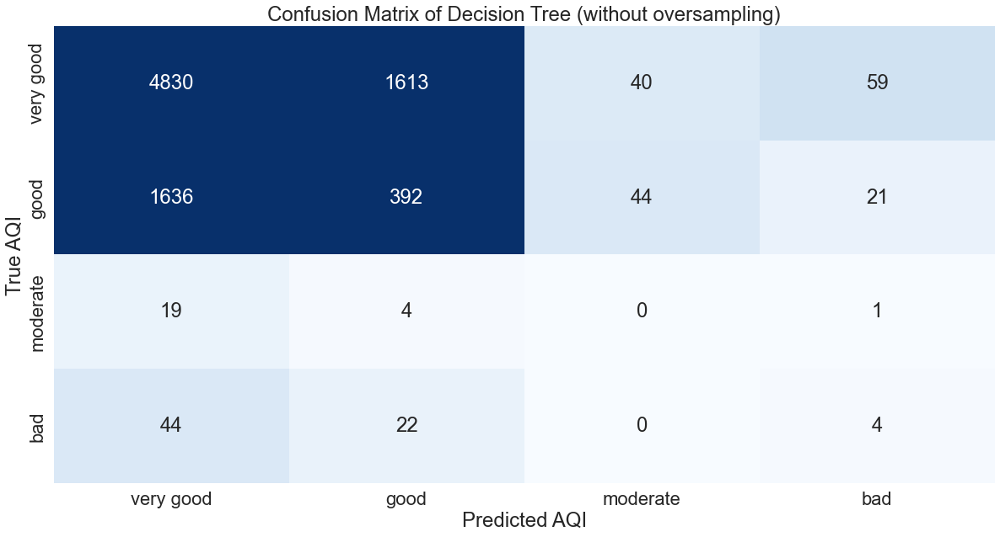

Accuracy = 0.5986940084774889


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.918486 to fit


In [12]:
###############################################
###    2. Decision Tree with RFE & CV       ###
###############################################
params = {
    'estimator__criterion': ['gini', 'entropy'],
    'estimator__max_depth': [50, 60, 70],
    'estimator__splitter': ['best', 'random']
}

###############################################
###  2.1 Decision Tree without oversampling ###
###############################################
  
if decision_tree == True:
    print('\033[1m' + '\033[91m'+ 'Without oversampling' + '\033[91m'+'\033[0m')
    clf = GridSearchCV(
        estimator=RFE(tree.DecisionTreeClassifier()),
        param_grid=params,
        cv=5,
        n_jobs=-1,
        verbose=1,
        scoring='accuracy'
    )

    clf.fit(X_train, y_train.values.ravel())
    
    #best model:
    tree_model = clf.best_estimator_
    print(f'Best parameters by GridSearchCV: {clf.best_params_}','\n')
    
    # what estimators were used by the model?: 
    # (the default of 'n_features_to_select' is half of the total variables. so obviously 12/2 = 6 variables will be left)
    print(f"What estimators were used by the model?\n{list(tree_model.support_).count(True)} out of {len(list(tree_model.support_))} Estimators\n")
    data=list(zip(tree_model.support_, ['T', 'StrGlo', 'Jahr', 'Monat', 'Tag', 'Zweirad', 'Personenwagen', 'Lastwagen', 'Hr', 'RainDur', 'WVs', 'p'],tree_model.ranking_))
    df = pd.DataFrame(data, columns =['Used by RFE', 'Column name', 'Score'])
    print(df)
    
    # Plot entire Tree
    export_graphviz(tree_model.estimator_,
                    out_file='tree.dot',
                    class_names = ['1', '2' , '3', '4','5'],
                    rounded = True, 
                    proportion = False, 
                    precision = 2,
                    filled=True,
                    max_depth = 5) #to visualize only top x depth / default = None
    
    # Classification of 2021 values
    y_predicted=tree_model.predict(X_test)
    make_confusion_matrix(y_test,y_predicted, 'Decision Tree (without oversampling)')    
!dot -Tpng tree.dot -o tree.png -Gdpi=600
Image(filename = 'tree.png')



With oversampling
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters by GridSearchCV: {'estimator__criterion': 'gini', 'estimator__max_depth': 50, 'estimator__splitter': 'best'} 

What estimators were used by the model?
6 out of 12 Estimators

    Used by RFE    Column name  Score
0          True              T      1
1          True         StrGlo      1
2          True           Jahr      1
3         False          Monat      3
4          True            Tag      1
5         False        Zweirad      5
6          True  Personenwagen      1
7         False      Lastwagen      6
8         False             Hr      2
9         False        RainDur      7
10        False            WVs      4
11         True              p      1


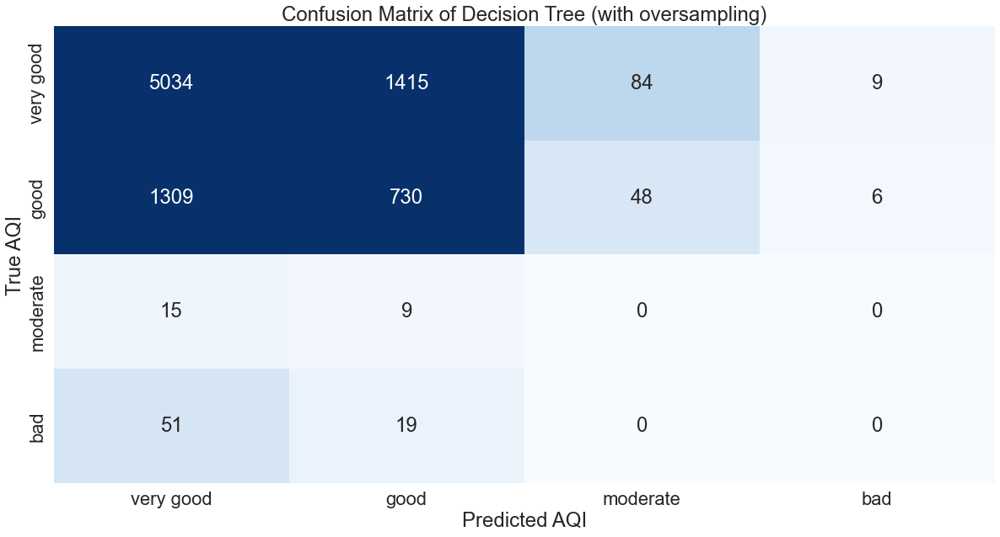

Accuracy = 0.6603276434872265


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.603811 to fit


In [13]:
###############################################
###  2.2 Decision Tree with oversampling    ###
###############################################

if decision_tree_oversampling == True:
    print('\033[1m' + '\033[91m'+ 'With oversampling' + '\033[91m'+'\033[0m')
    
    clf = GridSearchCV(
        estimator=RFE(tree.DecisionTreeClassifier()),
        param_grid=params,
        cv=5,
        n_jobs=-1,
        verbose=1,
        scoring='accuracy'
    )

    clf.fit(X_train_over, y_train_over.values.ravel())
    
    #best model:
    tree_model = clf.best_estimator_
    print(f'Best parameters by GridSearchCV: {clf.best_params_}','\n')
    
    # what estimators were used by the model?: 
    # (the default of 'n_features_to_select' is half of the total variables. so obviously 12/2 = 6 variables will be left)
    print(f"What estimators were used by the model?\n{list(tree_model.support_).count(True)} out of {len(list(tree_model.support_))} Estimators\n")
    data=list(zip(tree_model.support_, ['T', 'StrGlo', 'Jahr', 'Monat', 'Tag', 'Zweirad', 'Personenwagen', 'Lastwagen', 'Hr', 'RainDur', 'WVs', 'p'],tree_model.ranking_))
    df = pd.DataFrame(data, columns =['Used by RFE', 'Column name', 'Score'])
    print(df)
    
    # Plot entire Tree
    export_graphviz(tree_model.estimator_,
                    out_file='tree_over.dot',
                    class_names = ['1', '2' , '3', '4','5'],
                    rounded = True, 
                    proportion = False, 
                    precision = 2,
                    filled=True,
                    max_depth = 5) #to visualize only top x depth / default = None
    
    # Classification of 2021 values
    y_predicted=tree_model.predict(X_test)
    make_confusion_matrix(y_test,y_predicted, 'Decision Tree (with oversampling)')
    
!dot -Tpng tree_over.dot -o tree_over.png -Gdpi=600
Image(filename = 'tree_over.png')

Without oversampling

Best parameters by GridSearchCV: {'estimator__max_depth': 80, 'estimator__n_estimators': 200, 'estimator__n_jobs': -1} 

What estimators were used by the model?
6 out of 12 Estimators

    Used by RFE    Column name  Score
0          True              T      1
1         False         StrGlo      3
2         False           Jahr      7
3         False          Monat      5
4         False            Tag      2
5          True        Zweirad      1
6          True  Personenwagen      1
7         False      Lastwagen      4
8          True             Hr      1
9         False        RainDur      6
10         True            WVs      1
11         True              p      1


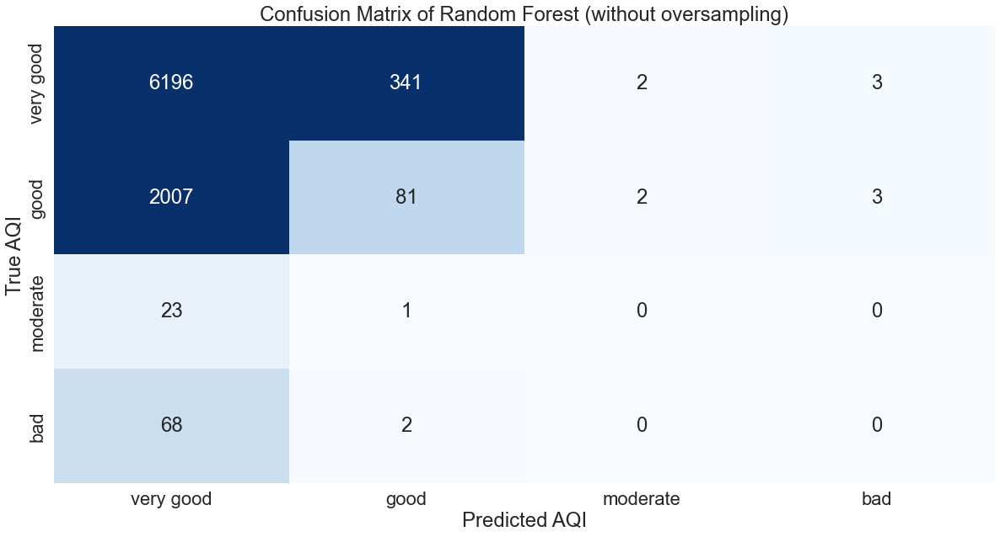

Accuracy = 0.7190972620002292


In [14]:
###############################################
###   3. Random Forest with CV and RFE      ###
###############################################
params = [{'estimator__n_estimators': [100, 200],
            'estimator__n_jobs': [-1],
            'estimator__max_depth': [40, 60, 80]}, ]

###############################################
###  3.1 Random Forest without oversampling ###
###############################################

if random_forest == True:
    print('\033[1m' + '\033[91m'+ 'Without oversampling' + '\033[91m'+'\033[0m')
    rfc = RandomForestClassifier()


    cv_rfc = GridSearchCV(RFE(rfc),
                          param_grid=params,
                          scoring='accuracy',
                          cv=5)

    cv_rfc.fit(X_train, y_train.values.ravel())
    
    random_forest_model = cv_rfc.best_estimator_    
    
    #Accuracy and parameter:
    print(f'\nBest parameters by GridSearchCV: {cv_rfc.best_params_}','\n')

    #what estimators were used by the model?:
    print(f"What estimators were used by the model?\n{list(random_forest_model.support_).count(True)} out of {len(list(random_forest_model.support_))} Estimators\n")
    data=list(zip(random_forest_model.support_, ['T', 'StrGlo', 'Jahr', 'Monat', 'Tag', 'Zweirad', 'Personenwagen', 'Lastwagen', 'Hr', 'RainDur', 'WVs', 'p'],random_forest_model.ranking_))
    df = pd.DataFrame(data, columns =['Used by RFE', 'Column name', 'Score'])
    print(df)
    # Plot first Tree of Random Forest
    export_graphviz(random_forest_model.estimator_[0],
                    out_file='tree_rf.dot',
                    class_names = ['1', '2' , '3', '4','5'],
                    rounded = True, 
                    proportion = False, 
                    precision = 2,
                    filled=True,
                    max_depth = 5) #to visualize only top x depth / default = None
    
    # Classification of 2021 values
    y_predicted=random_forest_model.predict(X_test)
    make_confusion_matrix(y_test,y_predicted, 'Random Forest (without oversampling)')

!dot -Tpng tree_rf.dot -o tree_rf.png -Gdpi=600
Image(filename = 'tree_rf.png')

In [15]:
###############################################
###  3.2 Random Forest with oversampling    ###
###############################################

if random_forest_oversampling == True:
    print('\033[1m' + '\033[91m'+ 'With oversampling' + '\033[91m'+'\033[0m')
    rfc = RandomForestClassifier()


    cv_rfc = GridSearchCV(RFE(rfc),
                          param_grid=params,
                          scoring='accuracy',
                          cv=5)

    cv_rfc.fit(X_train_over, y_train_over.values.ravel())
    
    random_forest_model = cv_rfc.best_estimator_    
    
    #Accuracy and parameter:
    print(f'\nBest parameters by GridSearchCV: {cv_rfc.best_params_}','\n')

    #what estimators were used by the model?:
    print(f"What estimators were used by the model?\n{list(random_forest_model.support_).count(True)} out of {len(list(random_forest_model.support_))} Estimators\n")
    data=list(zip(random_forest_model.support_, ['T', 'StrGlo', 'Jahr', 'Monat', 'Tag', 'Zweirad', 'Personenwagen', 'Lastwagen', 'Hr', 'RainDur', 'WVs', 'p'],random_forest_model.ranking_))
    df = pd.DataFrame(data, columns =['Used by RFE', 'Column name', 'Score'])
    print(df)
    # Plot first Tree of Random Forest
    export_graphviz(random_forest_model.estimator_[0],
                    out_file='tree_rf_over.dot',
                    class_names = ['1', '2' , '3', '4','5'],
                    rounded = True, 
                    proportion = False, 
                    precision = 2,
                    filled=True,
                    max_depth = 5) #to visualize only top x depth / default = None
    
    # Classification of 2021 values
    y_predicted=random_forest_model.predict(X_test)
    make_confusion_matrix(y_test,y_predicted, 'Random Forest (with oversampling)')

!dot -Tpng tree_rf_over.dot -o tree_rf_over.png -Gdpi=600
Image(filename = 'tree_rf_over.png')

With oversampling


KeyboardInterrupt: 